In [37]:
from PIL import Image, ImageFilter
import numpy as np

# image path
path = "/Users/alayshah/Desktop/DSCF2899.JPG"

image = Image.open(fp=path)

img_data = np.array(image)

my_brightness_threshold = 100

my_blur_radius = 250

color_tint = [255, 100, 100]

In [38]:
# but first a quick helper
# jupyter nb was way too big for github, downscaling image by half, just for visuals
def scaleDownImage(img: Image, factor=0.1): 
    width, height = img.size
    new_width = int(width * factor)
    new_height = int(height * factor)
    return img.resize((new_width, new_height), Image.Resampling.LANCZOS)

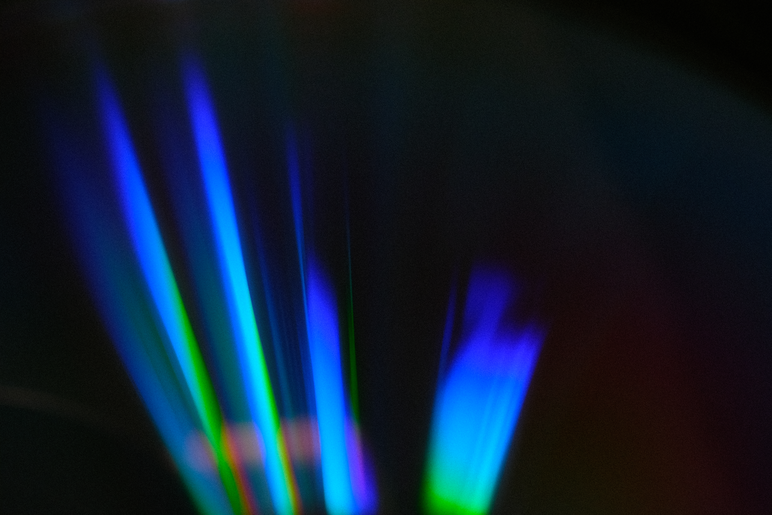

In [39]:
# lets look at our input image
scaleDownImage(image)

In [40]:
# split the rgb channels -> will be used for luminance form
red_channel = img_data[:, :, 0]
green_channel = img_data[:, :, 1]
blue_channel = img_data[:, :, 2]

# luminance formula (from google says can be used for sRGB) -> .2126 R + .7152 G + .0722 B
# returns 2d array of pixel lumination 
luminance =  (0.2126 * red_channel + 0.7152 * green_channel + 0.0722 * blue_channel)

# we can then convert this to a binary mask on our image white for bright, black for dark
binary_mask = np.where(luminance[:,:] > my_brightness_threshold, 255, 0).astype(np.uint8)

binary_mask

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(5152, 7728), dtype=uint8)

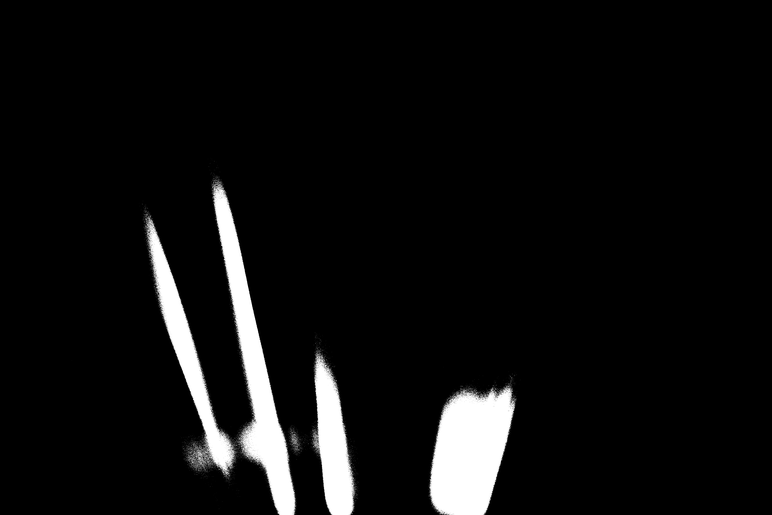

In [41]:
binary_mask_img = Image.fromarray(binary_mask)

# you can now see where the brightest pixels are ! super cool
scaleDownImage(binary_mask_img)

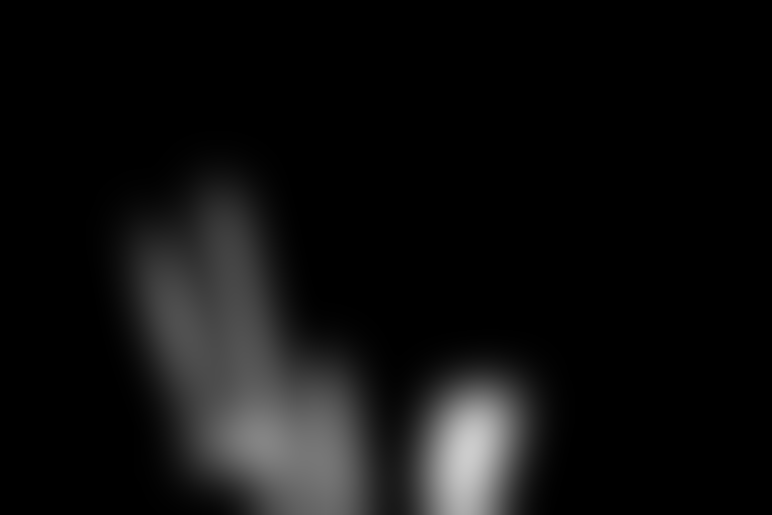

In [42]:
# now that we have the binary mask of the brightest pixels
# we need to create a gaussian blur around the pixels to create the hazy effect we see in halations 

# we can now see where we will be applying the color in our image
blurred_mask = binary_mask_img.filter(ImageFilter.GaussianBlur(radius=my_blur_radius))
scaleDownImage(blurred_mask)

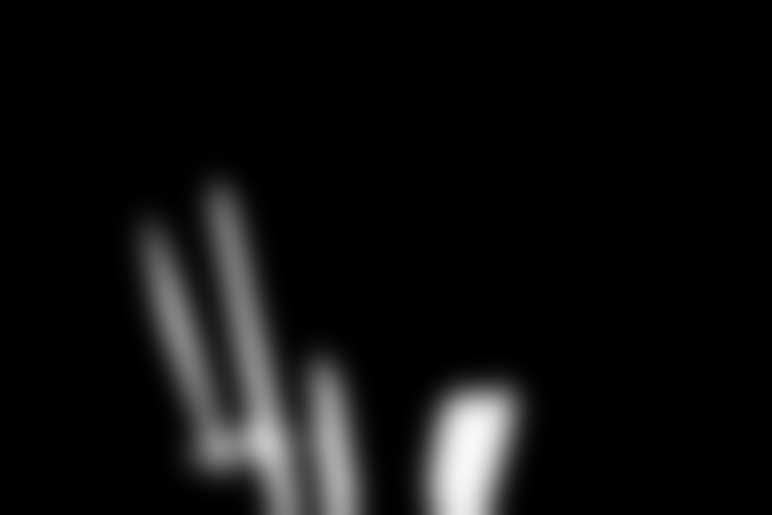

In [17]:
from scipy.ndimage import gaussian_filter

# I thought this would be quicker 
# but its actually much slower than converting the mask into and image and then applying the blur filter on it... odd
# turns out pillow is highly optimized for images so we'll cont using pillow, even if it means more intermediary image creation 
non_image_blur = gaussian_filter(binary_mask, sigma=150)

scaleDownImage(img=Image.fromarray(non_image_blur))

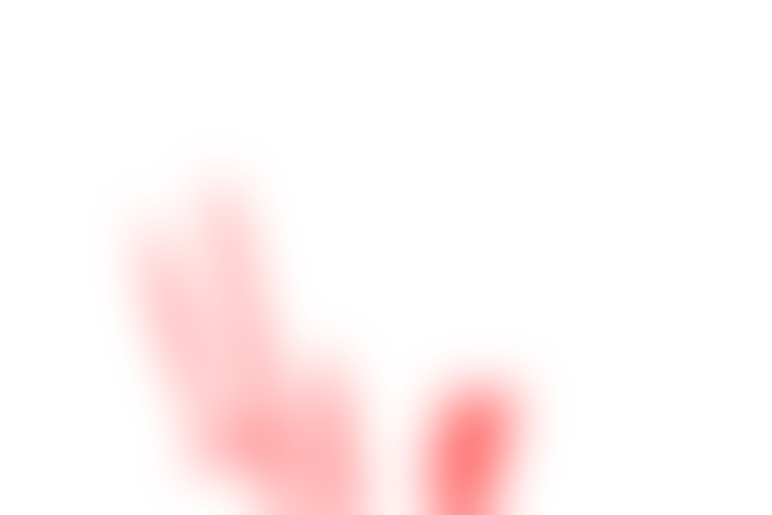

In [49]:
# now that i have the mask, lets now use that to create the color tint, using the greyscale image as alpha

my_halation_layer = np.stack(
    (
        np.full_like(blurred_mask, color_tint[0], dtype=np.uint8),
        np.full_like(blurred_mask, color_tint[1], dtype=np.uint8),
        np.full_like(blurred_mask, color_tint[2], dtype=np.uint8),
        blurred_mask
    ),
    axis=2
)
# now we can see the halation for the image
halation = Image.fromarray(my_halation_layer)
scaleDownImage(halation)

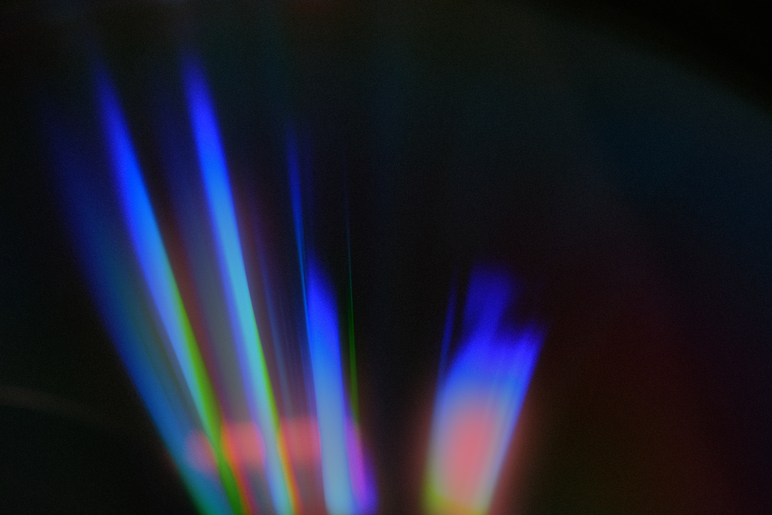

In [50]:
# now we can get halations!
image_with_halation = Image.alpha_composite(image.convert("RGBA"), halation)
scaleDownImage(image_with_halation)

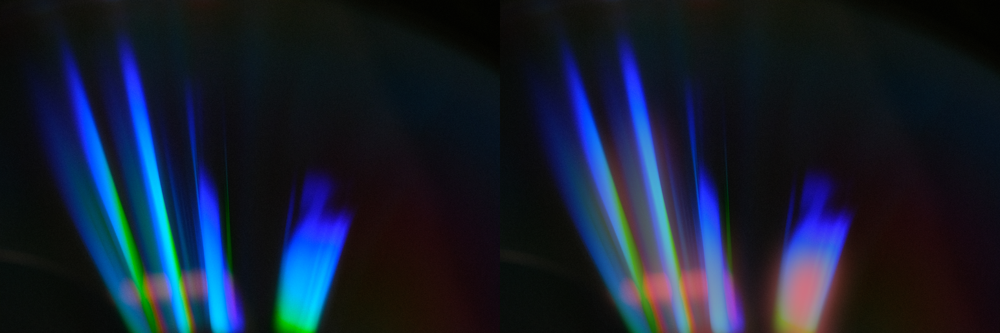

In [51]:
# show side by side (hack by merging them into 1 image)
scaled_down_before = scaleDownImage(image)
scaled_down_after = scaleDownImage(image_with_halation)

height = scaled_down_before.size[1] #same height
width = scaled_down_before.size[0] # same width
combined_image = Image.new('RGB', (width * 2, height))
combined_image.paste(scaled_down_before, (0, 0))
combined_image.paste(scaled_down_after, (width, 0))

combined_image




In [55]:
def create_halation(img: Image, brightness_threshold=100, blur_radius=250): 
    img_data = np.array(image)
    # split the rgb channels -> will be used for luminance form
    red_channel = img_data[:, :, 0]
    green_channel = img_data[:, :, 1]
    blue_channel = img_data[:, :, 2]

    # luminance formula (from google says can be used for sRGB) -> .2126 R + .7152 G + .0722 B
    # returns 2d array of pixel lumination 
    luminance =  (0.2126 * red_channel + 0.7152 * green_channel + 0.0722 * blue_channel)

    # we can then convert this to a binary mask on our image white for bright, black for dark
    blurred_binary_mask = Image.fromarray(np.where(luminance[:,:] > brightness_threshold, 255, 0).astype(np.uint8)).filter(ImageFilter.GaussianBlur(radius=blur_radius))
    halation_layer = Image.fromarray(np.stack(
        (
            np.full_like(blurred_binary_mask, color_tint[0], dtype=np.uint8),
            np.full_like(blurred_binary_mask, color_tint[1], dtype=np.uint8),
            np.full_like(blurred_binary_mask, color_tint[2], dtype=np.uint8),
            blurred_binary_mask
        ),
        axis=2
    ))
    return Image.alpha_composite(image.convert("RGBA"), halation_layer)
    
def showFourImageGrid(img1, img2, img3, img4):
    s_img1 = scaleDownImage(img1)
    s_img2 = scaleDownImage(img2)
    s_img3 = scaleDownImage(img3)
    s_img4 = scaleDownImage(img4)
    height = s_img1.size[1] #same height
    width = s_img1.size[0] # same width
    combined_image = Image.new('RGBA', (width * 2, height*2))
    combined_image.paste(s_img1, (0, 0))
    combined_image.paste(s_img2, (width, 0))
    combined_image.paste(s_img3, (0, height))
    combined_image.paste(s_img4, (width, height))
    return combined_image
    

    


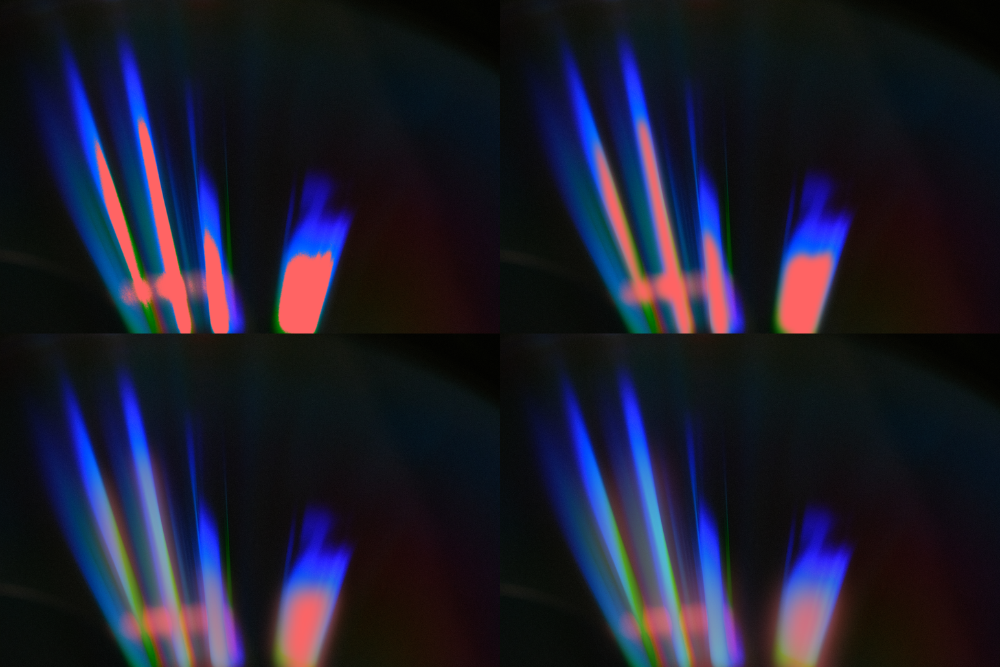

In [56]:
# now lets look at how the blur radius affects the generated image
radius_5 = create_halation(image, blur_radius=5)
radius_50 = create_halation(image, blur_radius=50)
radius_150 = create_halation(image, blur_radius=150)
radius_250 = create_halation(image, blur_radius=250)


showFourImageGrid(radius_5, radius_50, radius_150, radius_250)

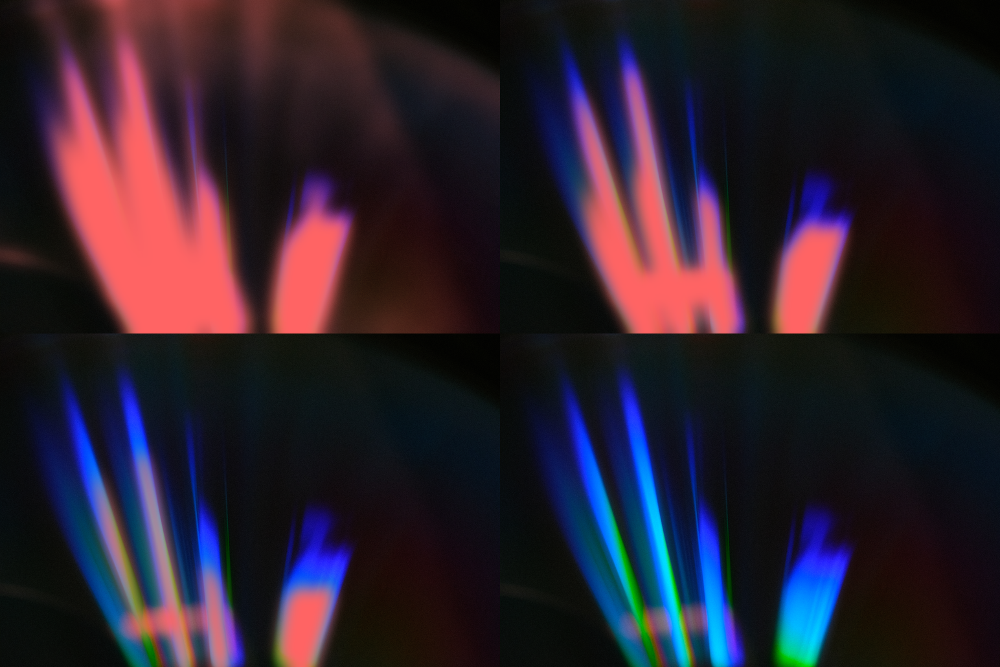

In [60]:
# what about brightness threshold?
# now lets look at how the brightness threshold affects the generated image
threshold_25 = create_halation(image, blur_radius=100, brightness_threshold=25)
threshold_50 = create_halation(image, blur_radius=100, brightness_threshold=50)
threshold_100 = create_halation(image, blur_radius=100, brightness_threshold= 100)
threshold_150 = create_halation(image, blur_radius=100, brightness_threshold=150)


showFourImageGrid(threshold_25, threshold_50, threshold_100, threshold_255)